In [345]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob

import ipywidgets as widgets

# Define the input video file path
input_file = 'C:/Users/ASUS/Desktop/Machine Learning/Visual-Perception-Projects-object-detection-semantic-segmentation-and-data-annotation-/Data Annotation and Labeling/archive (24)/bdd100k/videos/train/00d4b6b7-7d0a60bf.mov'
# Create a video widget with smaller dimensions




In [346]:
video_widget = widgets.Video.from_file(input_file, width=800, height=600)
video_widget

Video(value=b'\x00\x00\x00\x14ftypqt  \x00\x00\x02\x00qt  \x00\x00\x00\x08wide\x01<\x86\x7fmdat\x00\x00\x00\x1…

Open the Video and Read Metadata

In [347]:
import cv2
# Open the video file
cap = cv2.VideoCapture(input_file)

# Check if the video file is opened successfully
if not cap.isOpened():
    print("Error: Could not open video file")
    exit()

# Get the total number of frames in the video
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print("Total number of frames:", total_frames)




Total number of frames: 1209


In [348]:
# Get the frame height and width
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
print("Frame height:", frame_height)
print("Frame width:", frame_width)

Frame height: 720
Frame width: 1280


In [349]:
fps = cap.get(cv2.CAP_PROP_FPS)
print(f'FPS: {fps:0.2f}')

FPS: 30.10


In [350]:
# Release the video capture object
cap.release()

Pulling in Images from Video

In [351]:
cap = cv2.VideoCapture(input_file)

In [352]:
ret, img = cap.read()
print(f'Return: {ret} and image of share: {img.shape}')

Return: True and image of share: (720, 1280, 3)


In [353]:
def display_cv2_img(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplots(figsize=(15, 10))
    plt.imshow(img)
    plt.axis('off')

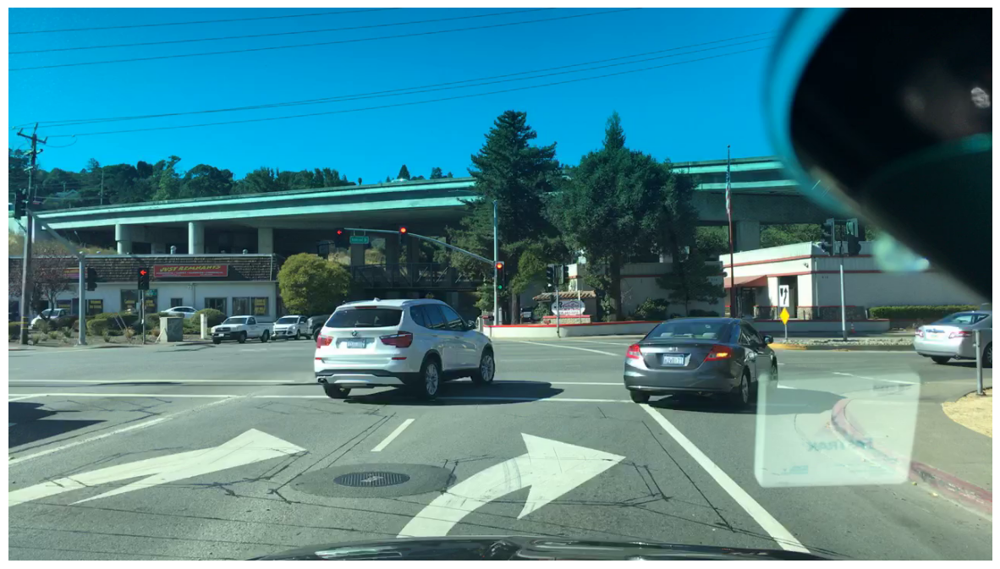

In [354]:
display_cv2_img(img)

In [355]:
cap.release()

Display multiple frames from the video

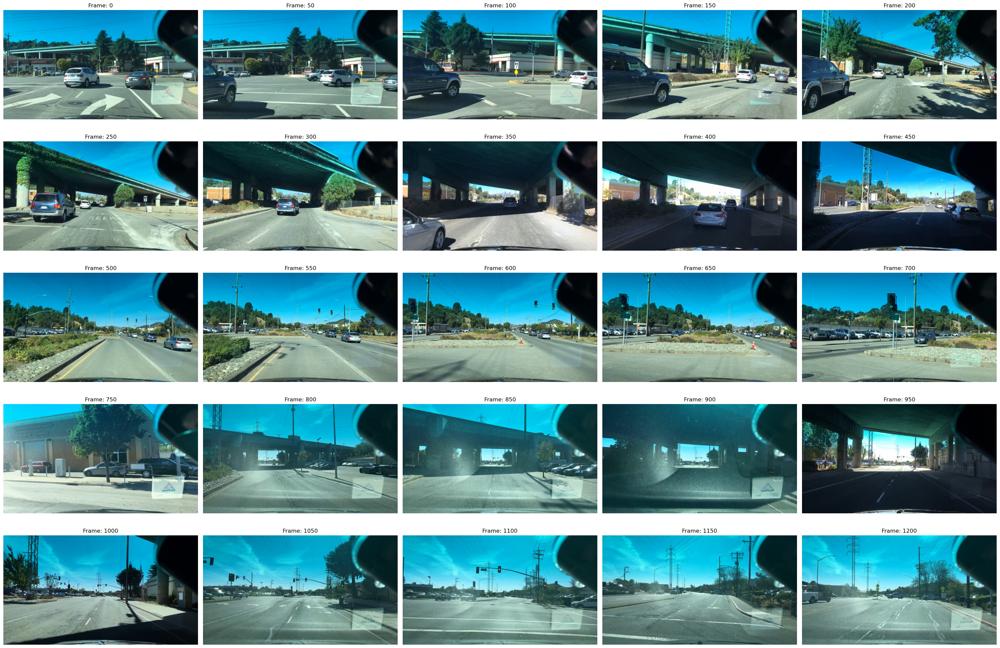

In [356]:
cap = cv2.VideoCapture(input_file)
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 50 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

Add annotation to video images

In [357]:
label = pd.read_csv(r'C:\Users\ASUS\Desktop\Machine Learning\Visual-Perception-Projects-object-detection-semantic-segmentation-and-data-annotation-\Data Annotation and Labeling\archive (24)\mot_labels.csv')

In [358]:
video_labels = (
    label.query('videoName == "00d4b6b7-7d0a60bf"').reset_index(drop=True).copy()
)
video_labels.shape

(1935, 14)

In [359]:
video_labels.frameIndex.nunique()

202

In [360]:
video_labels['videoFrame'] = (video_labels.frameIndex * 5.96).round().astype(int)
video_labels.tail()

,Unnamed: 0,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,videoFrame
1930,1077392,00d4b6b7-7d0a60bf-0000202.jpg,00d4b6b7-7d0a60bf,201,23914.0,car,False,False,False,544.988453,571.593533,387.436490,404.896074,True,1198
1931,1077393,00d4b6b7-7d0a60bf-0000202.jpg,00d4b6b7-7d0a60bf,201,23929.0,car,False,False,False,519.503341,538.088757,389.428981,405.810572,True,1198
1932,1077394,00d4b6b7-7d0a60bf-0000202.jpg,00d4b6b7-7d0a60bf,201,23939.0,car,False,True,False,194.627720,229.124712,382.949980,410.062371,True,1198
1933,1077395,00d4b6b7-7d0a60bf-0000202.jpg,00d4b6b7-7d0a60bf,201,23936.0,car,False,False,False,473.366931,493.587337,387.577838,406.282995,True,1198
1934,1077396,00d4b6b7-7d0a60bf-0000202.jpg,00d4b6b7-7d0a60bf,201,23940.0,car,False,True,False,1147.966437,1219.235447,395.907982,430.154130,True,1198


In [361]:
video_labels.category.unique()

array(['car', 'bus', 'truck', 'pedestrian', 'other vehicle', 'rider',
       'bicycle'], dtype=object)

In [362]:
# pulling frame with highest objects or entity
video_labels.groupby('videoFrame').size().sort_values(ascending=False).head()

videoFrame
679    21
673    21
685    20
668    20
656    19
dtype: int64

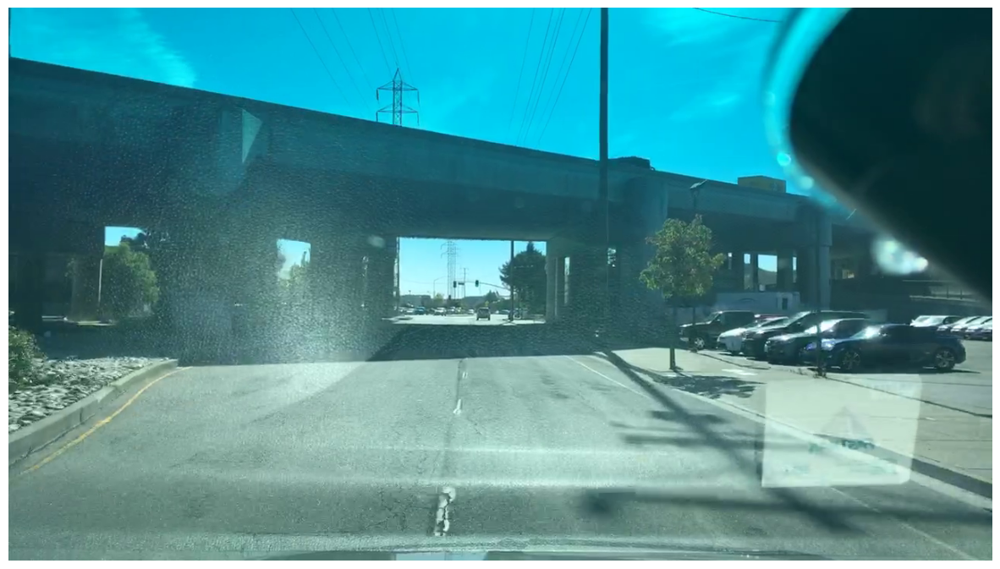

In [363]:
# pulling frame 47
cap = cv2.VideoCapture(input_file)

# n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
get_frame = 840

for frame in range(get_frame):
    ret, img = cap.read()
    if not ret:
        break

plt.subplots(figsize=(15, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off');
cap.release()

In [364]:
img.shape

(720, 1280, 3)

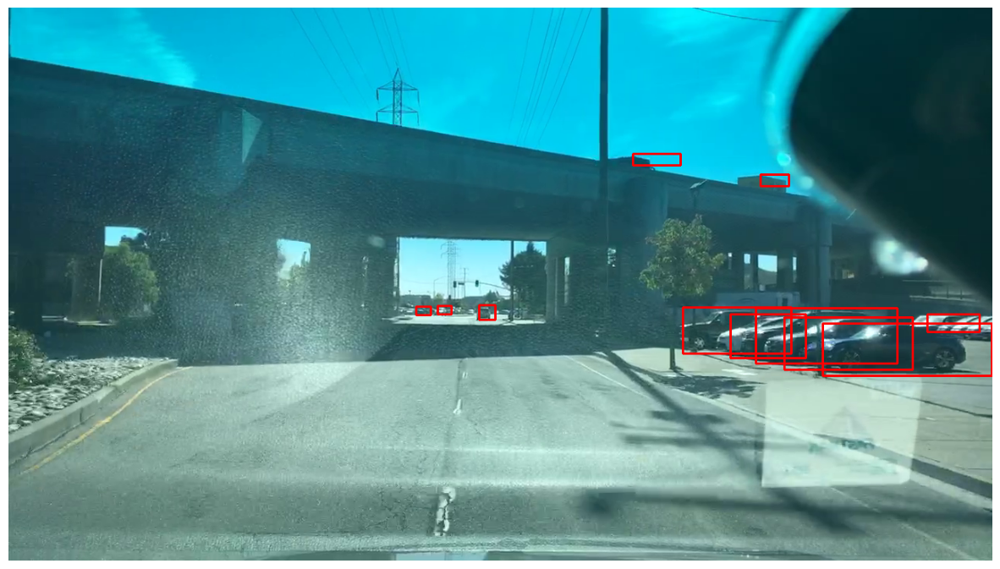

In [365]:
frame_labels = video_labels.query('videoFrame == 840')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img, pt1, pt2, (0, 0, 255), 2)

display_cv2_img(img)

In [366]:
d

Unnamed: 0                                    1076829
name                    00d4b6b7-7d0a60bf-0000142.jpg
videoName                           00d4b6b7-7d0a60bf
frameIndex                                        141
id                                            23888.0
category                                          car
attributes.crowd                                False
attributes.occluded                              True
attributes.truncated                            False
box2d.x1                                  1195.150115
box2d.x2                                  1263.325635
box2d.y1                                   399.076212
box2d.y2                                   422.355658
haveVideo                                        True
videoFrame                                        840
Name: 1367, dtype: object

Displaying color by category

In [367]:
# video_labels[['category', 'id']].set_index('category').to_dict()['id']
color = video_labels.category.value_counts().to_dict()
color

{'car': 1405,
 'truck': 418,
 'pedestrian': 36,
 'rider': 35,
 'bus': 17,
 'other vehicle': 16,
 'bicycle': 8}

In [368]:
color['pedestrian'] = (255, 0, 0)
color['car'] = (0, 0, 255)
color['truck'] = (0, 255, 0)
color['motorcycle'] = (255, 255, 0)
color['rider'] = (255, 0, 255)
color['bicycle'] = (0, 255, 255)
color['bus'] = (255, 165, 0)
color


{'car': (0, 0, 255),
 'truck': (0, 255, 0),
 'pedestrian': (255, 0, 0),
 'rider': (255, 0, 255),
 'bus': (255, 165, 0),
 'other vehicle': 16,
 'bicycle': (0, 255, 255),
 'motorcycle': (255, 255, 0)}

In [369]:
cap = cv2.VideoCapture(input_file)

get_frame = 840

for i in range(get_frame):
    ret, img = cap.read()
    if not ret:
        break

cap.release()

In [370]:
video_labels.head(2)

,Unnamed: 0,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,videoFrame
0,1075462,00d4b6b7-7d0a60bf-0000001.jpg,00d4b6b7-7d0a60bf,0,23824.0,car,False,False,False,396.997691,633.949192,376.628176,512.147806,True,0
1,1075463,00d4b6b7-7d0a60bf-0000001.jpg,00d4b6b7-7d0a60bf,0,23825.0,car,False,False,False,799.399538,1001.431871,401.570439,525.450346,True,0


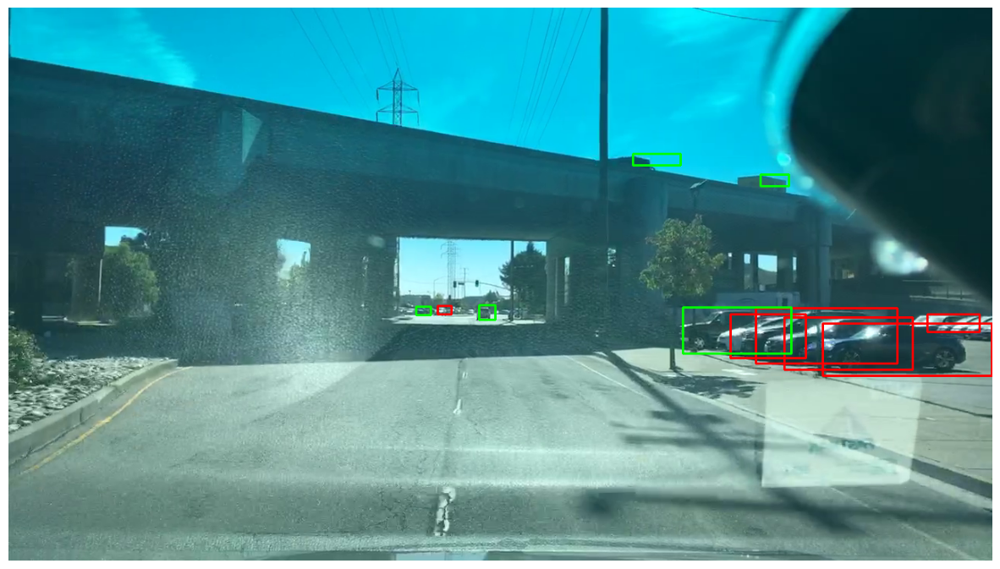

In [371]:
frame_labels = video_labels.query('videoFrame == 840')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img, pt1, pt2, color[d['category']], 2)

display_cv2_img(img)

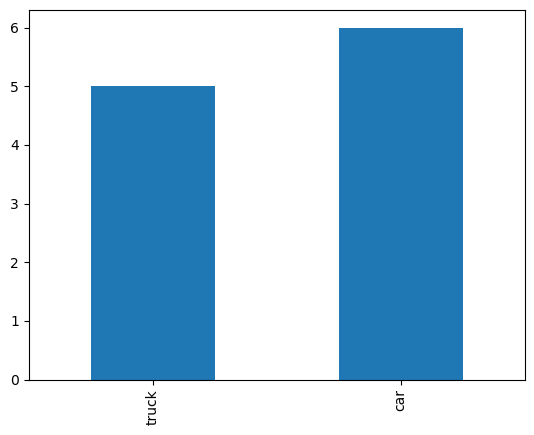

In [372]:
frame_labels.category.value_counts().sort_values().plot(kind='bar');

In [373]:
d

Unnamed: 0                                    1076829
name                    00d4b6b7-7d0a60bf-0000142.jpg
videoName                           00d4b6b7-7d0a60bf
frameIndex                                        141
id                                            23888.0
category                                          car
attributes.crowd                                False
attributes.occluded                              True
attributes.truncated                            False
box2d.x1                                  1195.150115
box2d.x2                                  1263.325635
box2d.y1                                   399.076212
box2d.y2                                   422.355658
haveVideo                                        True
videoFrame                                        840
Name: 1367, dtype: object

Adding text with rectangle

In [374]:
cap = cv2.VideoCapture(input_file)

for i in range(get_frame):
    ret, img = cap.read()
    if not ret:
        break

cap.release()

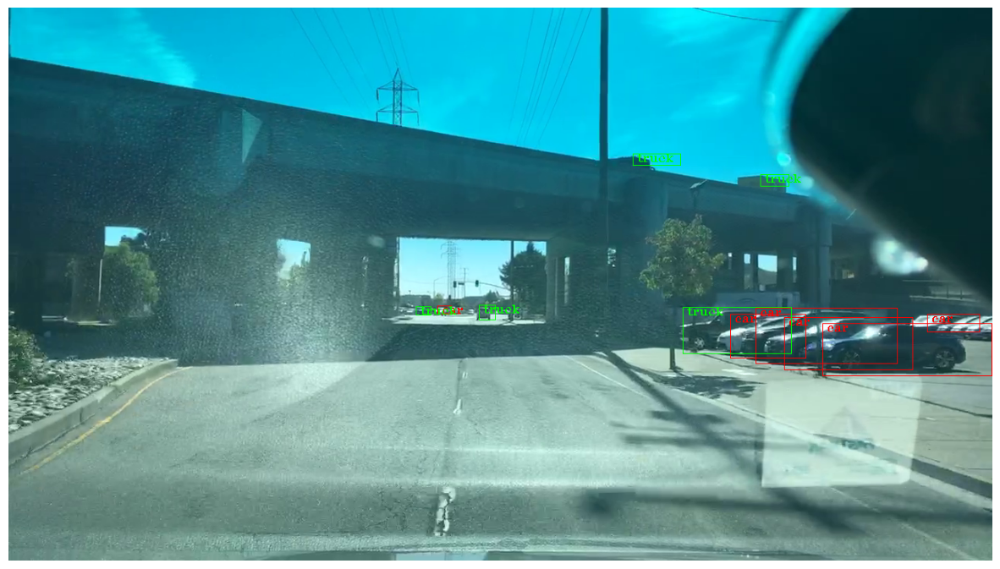

In [375]:
img_ex = img.copy()

font = cv2.FONT_HERSHEY_TRIPLEX

for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img_ex, pt1, pt2, color[d['category']])
    pt_text = int(d['box2d.x1']) + 5, int(d['box2d.y1']) + 10
    cv2.putText(img_ex, d['category'], pt_text, font, 0.5, color[d['category']])

display_cv2_img(img_ex)

Label and output annotated video

In [376]:
def add_annotation(img, frame, video_labels):
    max_supported_frame = video_labels.query('videoFrame <= @frame')['videoFrame'].max()
    frame_labels = video_labels.query('videoFrame == @max_supported_frame')

    font = cv2.FONT_HERSHEY_TRIPLEX

    for i, d in frame_labels.iterrows():
        pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
        pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
        cv2.rectangle(img, pt1, pt2, color[d['category']])
        pt_text = int(d['box2d.x1']) + 5, int(d['box2d.y1']) + 10
        cv2.putText(img, d['category'], pt_text, font, 0.5, color[d['category']])

    return img

In [377]:
from tqdm.notebook import tqdm
fps = 29.97
width = 1280
height = 720

VIDEO_CODEC ='MP4V'
out = cv2.VideoWriter('out_test_4.mp4',
                cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                fps,
                (width, height))

cap = cv2.VideoCapture(input_file)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if not ret:
        break

    img = add_annotation(img, frame, video_labels)

    out.write(img)


cap.release()
out.release()

  0%|          | 0/1209 [00:00<?, ?it/s]